# Рынок заведений общественного питания Москвы

В рамках проекта необходимо исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места для открытия заведения общественного питания.
В распоряжении имеется датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года.

## Загрузка данных и изучение общей информации

In [1]:
import pandas as pd
pd.options.mode.chained_assignment = None
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(rc={'figure.figsize':(11.7,8.27)})
import plotly.express as px
from folium import Map, Choropleth, Marker
from folium.plugins import MarkerCluster
import json

In [2]:
data = pd.read_csv('moscow_places.csv')

In [3]:
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


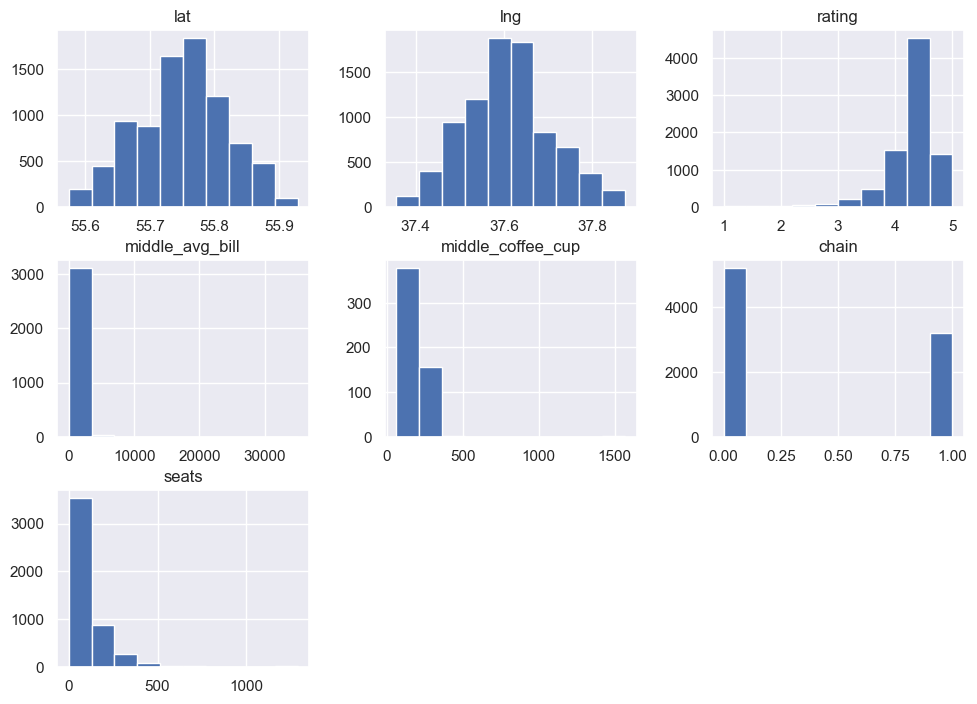

In [5]:
data.hist();

В датасете представлено 8406 заведений, названия столбцов написаны корректно, во всех столбцах верные типы данных, соответствующие содержимому, кроме столбца seats. Есть пропуски, но не в ключевых столбцах, таких как название кафе, его расположение, координаты, категория и рейтинг.

## Предобработка данных

In [6]:
data.duplicated().sum()

0

In [7]:
data.duplicated(subset=['name', 'category', 'address']).sum()

0

In [8]:
dup = data[['name', 'category', 'address']]
dup = dup.astype(str).apply(lambda x: x.str.lower())
dup.duplicated().sum()

2

In [9]:
matched = dup[dup.duplicated()]
matched

,name,category,address
215,кафе,кафе,"москва, парк ангарские пруды"
1511,more poke,ресторан,"москва, волоколамское шоссе, 11, стр. 2"


In [10]:
data[data.index == 215]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
215,Кафе,кафе,"Москва, парк Ангарские пруды",Северный административный округ,"ежедневно, 10:00–22:00",55.881438,37.531848,3.2,NaN,NaN,NaN,NaN,0,NaN


In [11]:
data = data.drop(index=[215, 1511])

In [12]:
data[data.index == 215]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats


In [13]:
data = data.reset_index(drop=True)

*Было обнаружено 2 неявных дубликата, они были удалены.*

### Добавляем столбец "street"

In [14]:
data['street'] = ''

In [15]:
for i in range(len(data)):
    data['street'][i] = data['address'][i].split(',')[1]

In [16]:
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица


### Добавляем столбец "is_24/7"

In [17]:
data['is_24/7'] = data['hours'] == 'ежедневно, круглосуточно'

*Дубликатов обнаружено не было. Пропуски было принято решение оставить. Добавлены новые столбцы в датасет с улицей заведения и булевым значениям круглосуточной работы.*

## Анализ данных

### Какие категории представлены

In [18]:
category_number = data.groupby('category')['category'].count().sort_values(ascending=True)
category_number

category
булочная            256
столовая            315
быстрое питание     603
пиццерия            633
бар,паб             765
кофейня            1413
ресторан           2042
кафе               2377
Name: category, dtype: int64

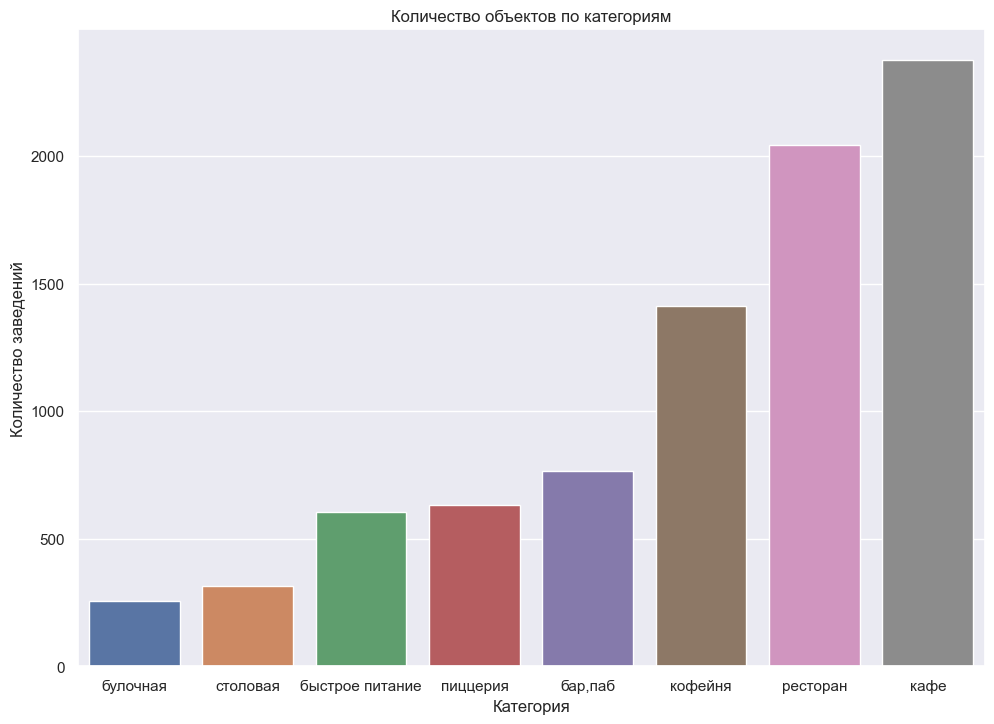

In [19]:
sns.barplot(x=category_number.index, y=category_number)
plt.title('Количество объектов по категориям')
plt.xlabel('Категория')
plt.ylabel('Количество заведений');

*На графике видно, что большинство заведений общественного питания в Москве - это кафе и рестораны, чуть меньше кофеен. Далее идут бары, пабы, пиццерии и т.д.*

### Количество посадочных мест по категориям

In [20]:
seats_on_category = data.query('seats > 0').groupby('category')['seats'].median().sort_values()
seats_on_category = seats_on_category.astype(int)
seats_on_category

category
булочная           52
пиццерия           56
кафе               60
быстрое питание    75
кофейня            80
столовая           80
бар,паб            84
ресторан           90
Name: seats, dtype: int32

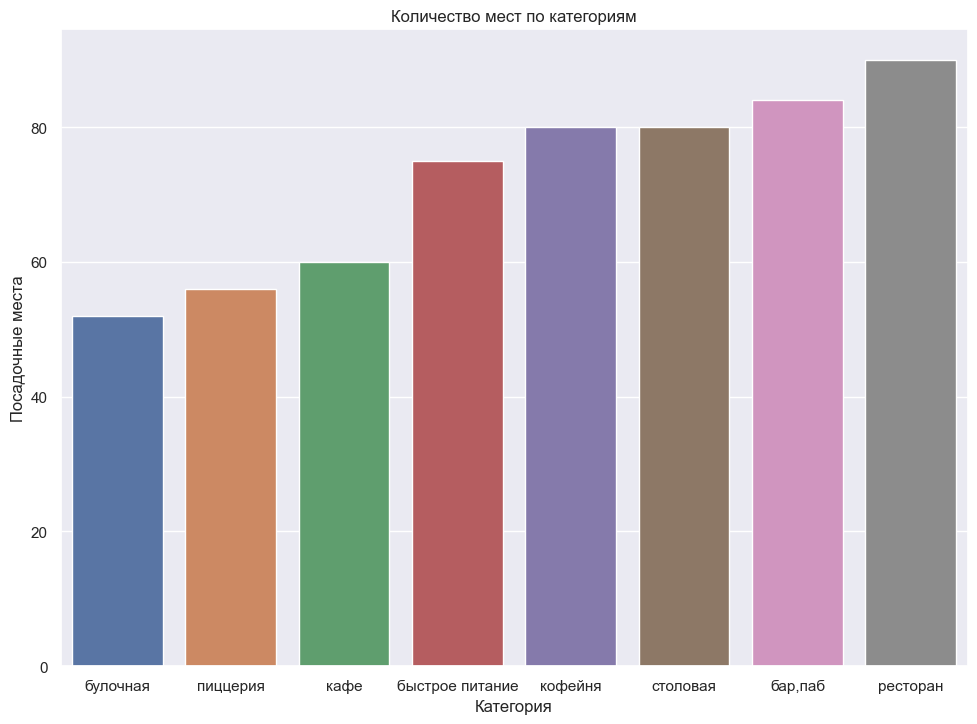

In [21]:
sns.barplot(x=seats_on_category.index, y=seats_on_category)
plt.title('Количество мест по категориям')
plt.xlabel('Категория')
plt.ylabel('Посадочные места');

*На самое большое количество людей рассчитаны рестораны, за ними сразу идут бары и пабы. Можно сказать, что больше всего посадочных мест предлагают заведения, рассчитанные на отдых и празднования, а не просто прием пищи. Чуть меньше этих двух категорий имеют столовые и кофейни. Меньше всего мест могут предложить булочные и пиццерии.*

### Соотношение сетевых и несетевых заведений

In [22]:
nets = data.groupby('chain')['chain'].count()
nets

chain
0    5200
1    3204
Name: chain, dtype: int64

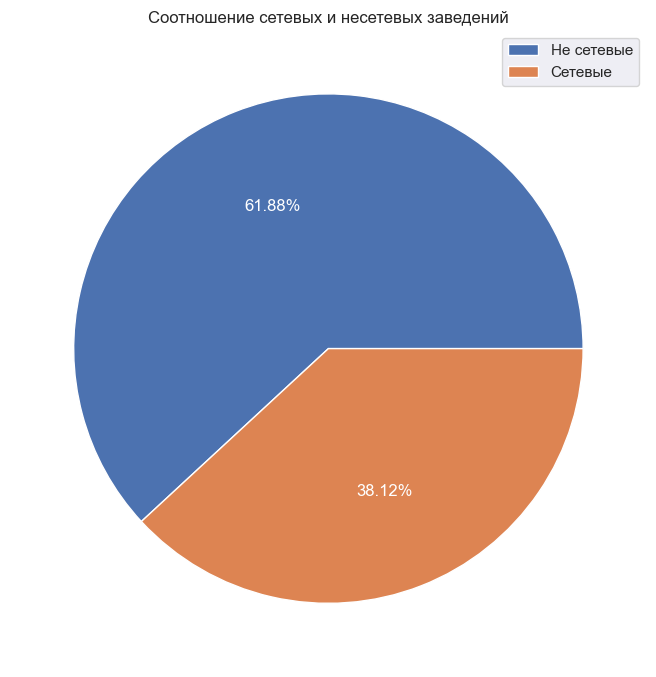

In [23]:
plt.pie(nets, labels=['Не сетевые', 'Сетевые'], autopct='%1.2f%%', textprops=dict(color='white'))
plt.title('Соотношение сетевых и несетевых заведений')
plt.legend();

*Несетевых заведений больше примерно в полтора раза.*

### Какие категории заведений чаще являются сетевыми

In [24]:
chains = round(data.groupby('category')['chain'].mean().sort_values(), 2)
chains = (chains*100).astype(int)
chains

category
бар,паб            22
столовая           28
кафе               33
ресторан           36
быстрое питание    38
кофейня            51
пиццерия           52
булочная           61
Name: chain, dtype: int32

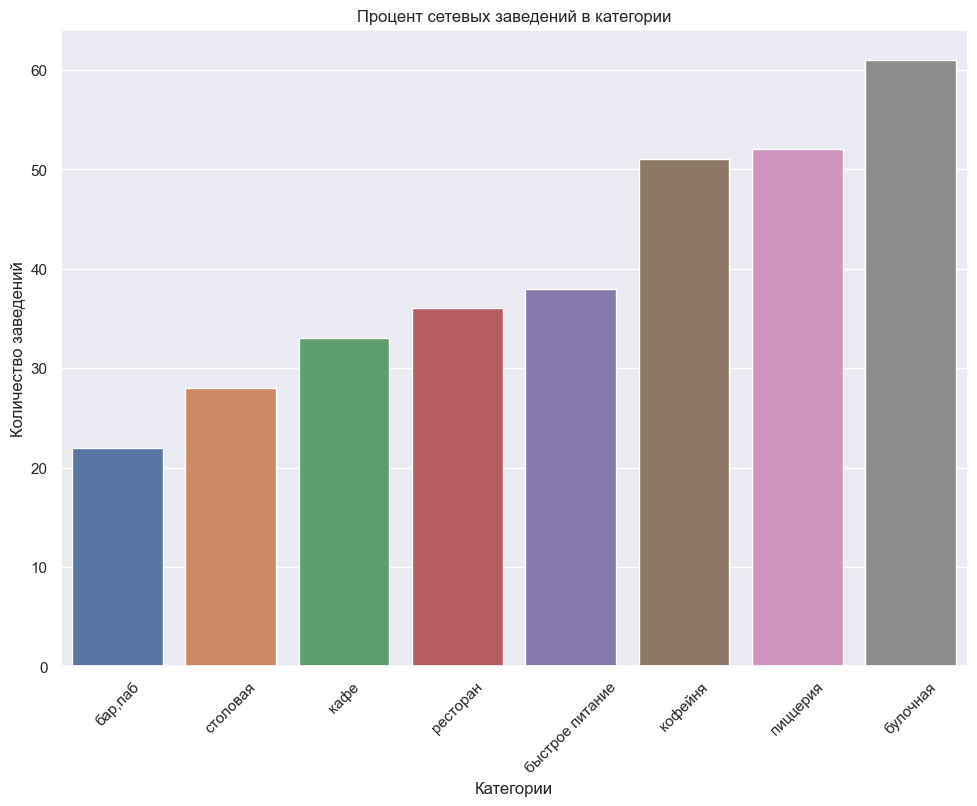

In [25]:
sns.barplot(x=chains.index, y=chains)
plt.title('Процент сетевых заведений в категории')
plt.xlabel('Категории')
plt.ylabel('Количество заведений')
plt.xticks(rotation=45);

*Сетевые заведения встречаются чаще в трех категориях: кофейня, пиццерия и булочная*

### Топ-15 популярных сетей

In [26]:
top15 = data.query('chain == 1').groupby('name')['name'].count().sort_values(ascending=False).head(15)
top15 = top15.sort_values()
top15

name
Му-Му                                   27
CofeFest                                32
Буханка                                 32
Чайхана                                 37
Теремок                                 38
Кулинарная лавка братьев Караваевых     39
КОФЕПОРТ                                42
Хинкальная                              44
Prime                                   50
Cofix                                   65
Яндекс Лавка                            69
One Price Coffee                        71
Додо Пицца                              74
Домино'с Пицца                          76
Шоколадница                            120
Name: name, dtype: int64

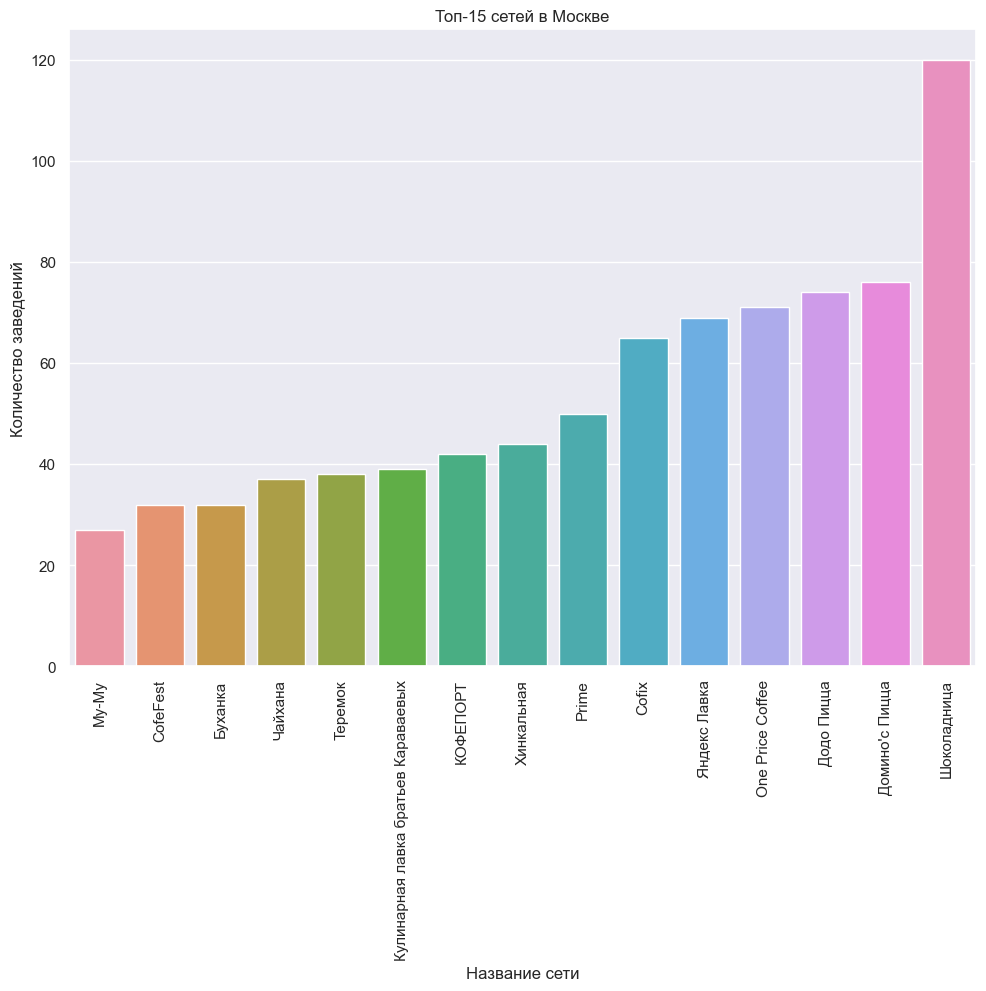

In [27]:
sns.barplot(x=top15.index, y=top15)
plt.title('Топ-15 сетей в Москве')
plt.xlabel('Название сети')
plt.ylabel('Количество заведений')
plt.xticks(rotation=90);

In [28]:
top15_cat = data.query('name in @top15.index').groupby('category')['name'].nunique().sort_values()
top15_cat

category
булочная           1
бар,паб            2
столовая           2
пиццерия           3
быстрое питание    4
ресторан           6
кофейня            7
кафе               8
Name: name, dtype: int64

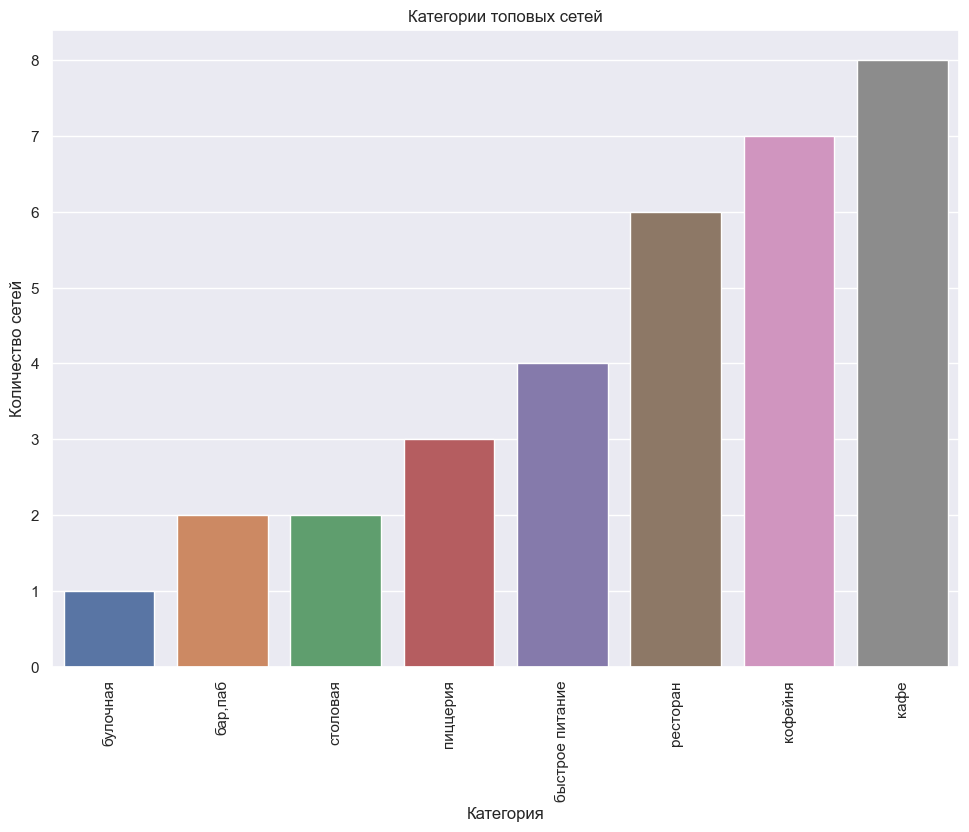

In [29]:
sns.barplot(x=top15_cat.index, y=top15_cat)
plt.title('Категории топовых сетей')
plt.xlabel('Категория')
plt.ylabel('Количество сетей')
plt.xticks(rotation=90);

*Самая большая сеть в Москве с наибольшим количеством заведений - сеть кофеен Шоколадница. Следом за ней идет Домино'с Пицца. Почти все сети в этом списке очень популярны и на слуху у людей. В основном это кафе, кофейни или рестораны.*

### Количество заведений каждой категории по районам

In [30]:
pivot_area = (data.pivot_table(index=['district', 'category'], values='name', aggfunc='count')
              .sort_values(by='name'))
pivot_area = pivot_area.reset_index()
pivot_area

,district,category,name
0,Северо-Западный административный округ,булочная,12
1,Юго-Восточный административный округ,булочная,13
2,Юго-Западный административный округ,столовая,17
3,Северо-Западный административный округ,столовая,18
4,Северо-Западный административный округ,"бар,паб",23
...,...,...,...
67,Юго-Восточный административный округ,кафе,282
68,Центральный административный округ,"бар,паб",364
69,Центральный административный округ,кофейня,428
70,Центральный административный округ,кафе,464


In [31]:
fig = px.bar(pivot_area, x='district', y='name', color='category', title='Распределение категорий заведений по районам',
            height=800, width=900)
fig.update_xaxes(title_text='Округ', categoryorder='total ascending')
fig.update_yaxes(title_text='Количество заведений')
fig.show()

*В центральном районе находится больше всего заведений, самой распространенной категорией в нем является "ресторан". В остальных районах преобладает категория "кафе".*

### Распределение средних рейтингов по категориям

In [32]:
mean_rating = data.groupby('category')['rating'].mean().sort_values()
mean_rating = round(mean_rating, 2)
mean_rating

category
быстрое питание    4.05
кафе               4.12
столовая           4.21
булочная           4.27
кофейня            4.28
ресторан           4.29
пиццерия           4.30
бар,паб            4.39
Name: rating, dtype: float64

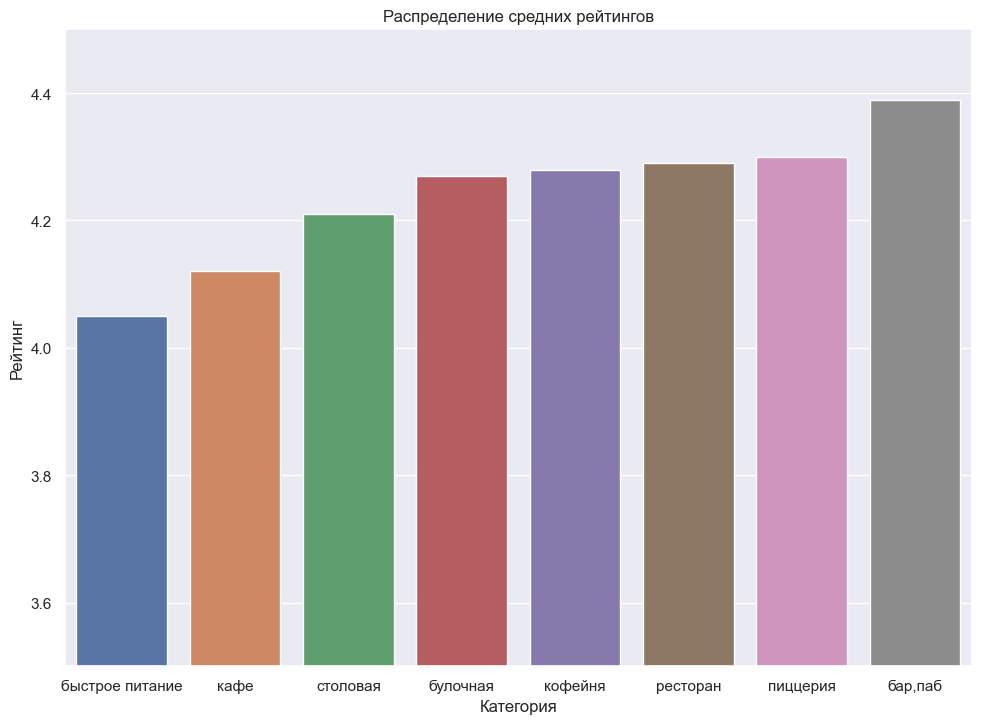

In [33]:
ax = sns.barplot(x=mean_rating.index, y=mean_rating)
ax.set_ylim(bottom=3.5, top=4.5)
plt.title('Распределение средних рейтингов')
plt.xlabel('Категория')
plt.ylabel('Рейтинг')
ax;

*В среднем у всех категорий рейтинг выше 4. Вперед вырывается категория "бар, паб". Это может быть связано с тем, что люди становятся добрее, выпивши. Также высокие рейтинги имеюи рестораны и пиццерии. Ресторан, как правило, соответствует высоким стандартам, а пиццу довольно тяжело испортить и ее все любят. Что касается самых низких средних рейтингов, то самой слабой категорией оказалась "быстрое питание". Это может быть связано с тем, что в ресторанах быстрого питания порой еда довольно низкого качества.*

### Хороплет со средним рейтингом заведений каждого района

In [34]:
rating_on_area = round(data.groupby('district')['rating'].mean(), 2)
rating_on_area

district
Восточный административный округ           4.17
Западный административный округ            4.18
Северный административный округ            4.24
Северо-Восточный административный округ    4.15
Северо-Западный административный округ     4.21
Центральный административный округ         4.38
Юго-Восточный административный округ       4.10
Юго-Западный административный округ        4.17
Южный административный округ               4.18
Name: rating, dtype: float64

In [35]:
with open('admin_level_geomap.geojson', encoding='utf-8') as f:
    state_geo = json.load(f)

In [36]:
moscow_lat, moscow_lng = 55.751244, 37.618423

In [37]:
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

In [38]:
Choropleth(
    geo_data=state_geo,
    data=rating_on_area,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(m)
m

*Самые высокие рейтинги у заведений, как ни странно, в центре. Судя по всему, там самые дорогие и элитарные заведения, соответственно, и уровень обслуживания и еды подобающий. Самые низкие рейтинги оказались в юго-восточном округе.*

### Все заведения на карте

In [39]:
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

In [40]:
marker_cluster = MarkerCluster().add_to(m)

In [41]:
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

In [42]:
data.apply(create_clusters, axis=1)

0       None
1       None
2       None
3       None
4       None
        ... 
8399    None
8400    None
8401    None
8402    None
8403    None
Length: 8404, dtype: object

In [43]:
m

### Топ-15 улиц по количеству заведений

In [44]:
top15_str = data.groupby('street')['name'].count().sort_values(ascending=False).head(15)
top15_str

street
 проспект Мира             184
 Профсоюзная улица         122
 проспект Вернадского      108
 Ленинский проспект        107
 Ленинградский проспект     95
 Дмитровское шоссе          88
 Каширское шоссе            77
 Варшавское шоссе           76
 Ленинградское шоссе        70
 МКАД                       65
 Люблинская улица           60
 улица Вавилова             55
 Кутузовский проспект       54
 улица Миклухо-Маклая       49
 Пятницкая улица            48
Name: name, dtype: int64

In [45]:
pivot_str = (data.query('street in @top15_str.index').pivot_table(index=['street', 'category'], values='name', aggfunc='count')
              .sort_values(by='name'))
pivot_str = pivot_str.reset_index()
pivot_str

,street,category,name
0,Люблинская улица,пиццерия,1
1,МКАД,"бар,паб",1
2,МКАД,столовая,1
3,Кутузовский проспект,булочная,1
4,проспект Вернадского,булочная,1
...,...,...,...
106,Профсоюзная улица,кафе,35
107,проспект Мира,кофейня,36
108,проспект Мира,ресторан,45
109,МКАД,кафе,45


In [46]:
fig = px.bar(pivot_str, x='street', y='name', color='category', title='Распределение категорий заведений по улицам',
            height=800, width=900)
fig.update_xaxes(title_text='Улица', categoryorder='total ascending')
fig.update_yaxes(title_text='Количество заведений')
fig.show()

*Самой насыщенной улицей в Москве оказался проспект Мира, на нем самая популярная категория - "кафе". В целом на популярных улицах преобладающими категориями являются кафе и рестораны.*

### Улицы с одним объектом

In [47]:
streets = data.groupby('street', as_index=False)['name'].count()
streets = streets.rename(columns={'name':'count'})
streets = streets[streets['count'] == 1]
streets

,street,count
0,1-й Автозаводский проезд,1
1,1-й Балтийский переулок,1
2,1-й Варшавский проезд,1
3,1-й Вешняковский проезд,1
5,1-й Голутвинский переулок,1
...,...,...
1436,улица Шкулёва,1
1437,улица Шкулёва 4,1
1439,улица Шухова,1
1442,улица Юннатов,1


In [48]:
one = data[data['street'].isin(streets['street'])]
one.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
15,Дом обеда,столовая,"Москва, улица Бусиновская Горка, 2",Северный административный округ,пн-пт 08:30–18:30; сб 10:00–20:00,55.885890,37.493264,4.1,средние,Средний счёт:300–500 ₽,400.0,NaN,0,180.0,улица Бусиновская Горка,False
21,7/12,кафе,"Москва, Прибрежный проезд, 7",Северный административный округ,"ежедневно, 10:00–22:00",55.876805,37.464934,4.5,NaN,NaN,NaN,NaN,0,NaN,Прибрежный проезд,False
25,В парке вкуснее,кофейня,"Москва, парк Левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,NaN,NaN,NaN,NaN,1,NaN,парк Левобережный,False
58,Coffeekaldi's,кофейня,"Москва, Угличская улица, 13, стр. 8",Северо-Восточный административный округ,"ежедневно, 09:00–22:00",55.900316,37.570558,4.1,средние,Средний счёт:500–800 ₽,650.0,NaN,1,NaN,Угличская улица,False
60,Чебуречная история,кофейня,"Москва, ландшафтный заказник Лианозовский",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.899845,37.570488,4.9,NaN,NaN,NaN,NaN,1,NaN,ландшафтный заказник Лианозовский,False


In [49]:
one_pivot = (one.pivot_table(index='category', values='name', aggfunc='count')
              .sort_values(by='name'))
one_pivot = one_pivot.reset_index()
one_pivot

,category,name
0,булочная,8
1,пиццерия,15
2,быстрое питание,23
3,столовая,36
4,"бар,паб",39
5,кофейня,84
6,ресторан,94
7,кафе,160


In [50]:
fig = px.bar(one_pivot, x='category', y='name', title='Категории единственных заведений на улице')
fig.update_xaxes(title_text='Категории', categoryorder='total ascending')
fig.update_yaxes(title_text='Количество заведений')
fig.show()

In [51]:
round(one['rating'].mean(), 2)

4.24

In [52]:
round(data['rating'].mean(), 2)

4.23

*Среди заведений, являющихся единственными на своей улице, больше всего кафе. Средний рейтинг у таких заведений составляет 4.24, примерно равен среднему по всему датасету.*

### Как удаленность от центра влияет на цены в заведениях

In [53]:
median_bill = data.groupby('district')['middle_avg_bill'].median().astype(int)
median_bill

district
Восточный административный округ            575
Западный административный округ            1000
Северный административный округ             650
Северо-Восточный административный округ     500
Северо-Западный административный округ      700
Центральный административный округ         1000
Юго-Восточный административный округ        450
Юго-Западный административный округ         600
Южный административный округ                500
Name: middle_avg_bill, dtype: int32

In [54]:
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

In [55]:
Choropleth(
    geo_data=state_geo,
    data=median_bill,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средняя цена в заведениях',
).add_to(m)
m

*Самые высокие цены в центре и на западе. В эти зоны входит аэропорт Внуково, в аэропортах цены всегда выше, чем в городе, и элитные районы, такие как Рублевка или Сколково. На северо-западе и юге цены самые низкие, там находится много спальных районов.*

*Промежуточный вывод: в датасете представлено 8 категорий заведений. Самые многочисленные из них: кафе и рестораны; самые немногочисленные: булочные и столовые. Наибольшее среднее количество посадочных мест оказалось в барах, пабах и ресторанах; самое маленькое число мест в булочных. Несетевых заведений оказалось больше почти в полтора раза. Сетевыми в основном являются кофейни, пиццерии и булочные. Самые популярные сети - это в основном сети кофеен, кафе и пиццерий. Также в датасете представлены 9 административных районов города Москвы. Самый высокий средний рейтинг оказался у баров, пабов, самый низкий напротив оказался у ресторанов быстрого питания. Самые рейтинговые заведения находятся в центре Москвы: скорее всего, это объясняется высоким уровнем сервиса и еды в этих заведениях. Но в то же время в центре и один из самых высоких средних чеков. Кроме центра высокие цены зафиксированы также в западной части Москвы: там находятся элитные районы и аэропорт Внуково.*

## Детилизирование исследования: открытие кофейни

### Сколько всего кофеен в датасете

In [56]:
len(data[data['category'] == 'кофейня'])

1413

*Всего в датасете представлено 1413 кофеен.*

In [57]:
round(len(data[data['category'] == 'кофейня']) / len(data), 2)

0.17

*В среднем каждое шестое заведение в датасете - кофейня.*

In [58]:
coffee_house_on_area = data.query('category == "кофейня"').groupby('district')['district'].count().sort_values()
coffee_house_on_area

district
Северо-Западный административный округ      62
Юго-Восточный административный округ        89
Юго-Западный административный округ         96
Восточный административный округ           105
Южный административный округ               131
Западный административный округ            150
Северо-Восточный административный округ    159
Северный административный округ            193
Центральный административный округ         428
Name: district, dtype: int64

In [59]:
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
Choropleth(
    geo_data=state_geo,
    data=coffee_house_on_area,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Количество кофеен по районам',
).add_to(m)
m

*Большинство кофеен расположено в центре города.*

### Круглосуточные кофейни

In [60]:
alltime_ch = data.loc[(data['category'] == 'кофейня') & (data['is_24/7'] == 1)]
len(alltime_ch)

59

In [61]:
fig = px.histogram(alltime_ch, x='district', title='Распределение круглосуточных кофеен по районам')
fig.update_xaxes(title_text='Район', categoryorder='total ascending')
fig.update_yaxes(title_text='Количество кофеен')
fig.show()

*Ожидаемо, почти все круглосуточные кофейни находятся в центре. На окраинах вряд ли будет кто-то ходить по ночам, а центр города часто привлекает туристов, которые могут быть не против взбодритсья.*

### Распределение рейтингов кофеен по районам

In [62]:
ch_ratings_on_area = round(data.query('category == "кофейня"').groupby('district')['rating'].mean().sort_values(), 2)
ch_ratings_on_area

district
Западный административный округ            4.20
Северо-Восточный административный округ    4.22
Юго-Восточный административный округ       4.23
Южный административный округ               4.23
Восточный административный округ           4.28
Юго-Западный административный округ        4.28
Северный административный округ            4.29
Северо-Западный административный округ     4.33
Центральный административный округ         4.34
Name: rating, dtype: float64

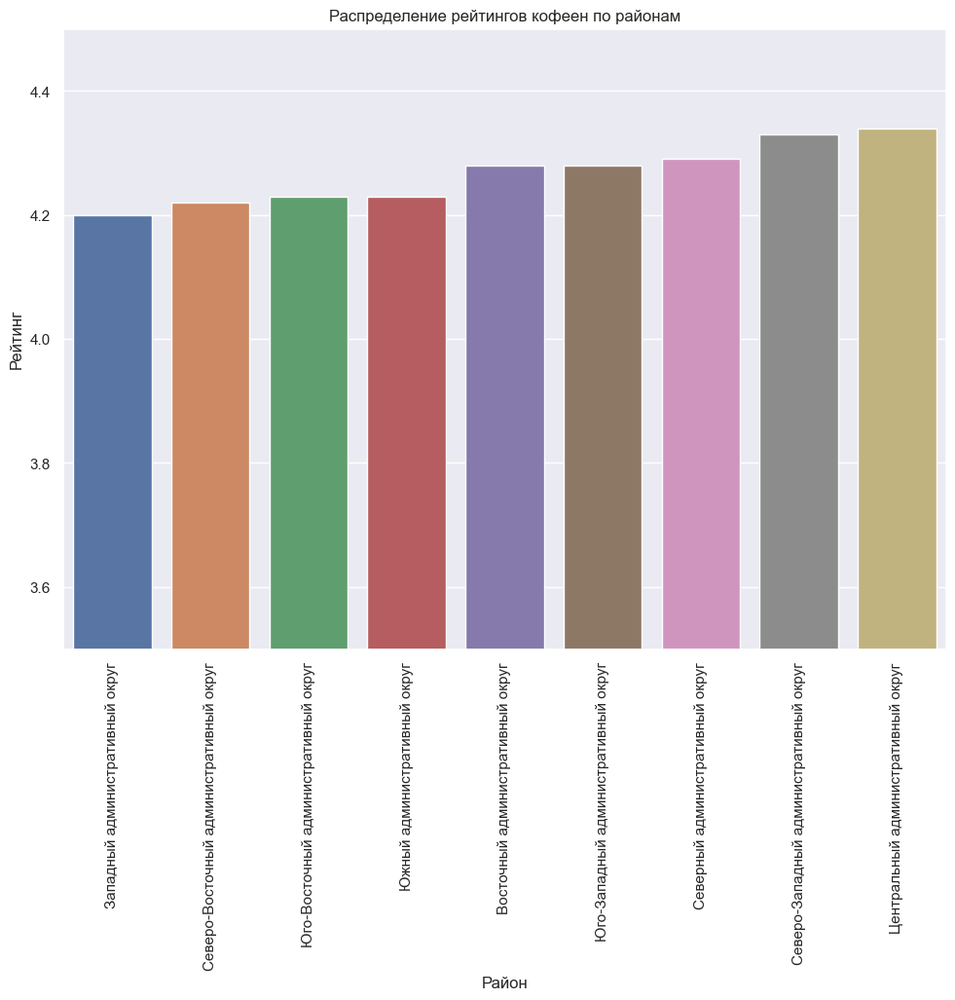

In [63]:
ax = sns.barplot(x=ch_ratings_on_area.index, y=ch_ratings_on_area)
ax.set_ylim(bottom=3.5, top=4.5)
plt.title('Распределение рейтингов кофеен по районам')
plt.xlabel('Район')
plt.ylabel('Рейтинг')
plt.xticks(rotation=90)
ax;

*Средние рейтинги кофеен по районам отличаются несильно, однако все же в Центральном округе рейтинг чуть выше, чем в других. А в западном чуть ниже.*

### Стоимость чашки капучино

In [64]:
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко,False
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко,False
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица,False
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко,False
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица,False


In [65]:
data['middle_coffee_cup'].median()

169.0

*При открытии имеет смысл сделать цену слегка меньше, чем у конкурентов. Медианная цена за чашку капучино в кофейнях Москвы около 170 рублей. Но цену в своем заведении стоит формировать исходя из цен конкурентов в своем районе, так как чем ближе помещение будет находиться к центру, тем больше будут цены, и тем больше будет плата за аренду.*

In [66]:
#распределение кофеен
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
marker_cluster = MarkerCluster().add_to(m)
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)
data.query('category == "кофейня"').apply(create_clusters, axis=1)
m

In [67]:
data.query('category == "кофейня" and district == "Центральный административный округ"')['middle_coffee_cup'].median()

190.0

In [68]:
#распределение круглосуточных кофеен
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
marker_cluster = MarkerCluster().add_to(m)
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)
data.loc[(data['category'] == 'кофейня') & (data['is_24/7'] == 1)].apply(create_clusters, axis=1)
m

In [69]:
price_ch = round(data.query('category == "кофейня"').groupby('district')['middle_coffee_cup'].mean(), 2)
price_ch

district
Восточный административный округ           174.02
Западный административный округ            189.94
Северный административный округ            165.79
Северо-Восточный административный округ    165.33
Северо-Западный административный округ     165.52
Центральный административный округ         187.52
Юго-Восточный административный округ       151.09
Юго-Западный административный округ        184.18
Южный административный округ               158.49
Name: middle_coffee_cup, dtype: float64

In [70]:
#цены в кофейнях
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
Choropleth(
    geo_data=state_geo,
    data=price_ch,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средняя цена за чашку капучино на район',
).add_to(m)
m

*Хоть в центре и будет большая конкуренция, все же рекомендацией будет открываться именно там. Арендная плата будет выше, однако и цену за продукт можно установить соответствующую. В центре Москвы большой поток людей, много туристов, таким образом, клиенты практически всегда гарантированы. За счет того, что люди гуляют в центре города даже ночью, можно сделать кофейню круглосуточной.*

### Презентация

Презентация: https://drive.google.com/file/d/18G3LdSYqB0zxjb9o5cMCN0IRG8bqTQB3/view?usp=sharing